In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/plant-leaf-disease-dataset/Plant_leave_diseases_dataset_with_augmentation/Corn___Northern_Leaf_Blight/image (849).JPG
/kaggle/input/plant-leaf-disease-dataset/Plant_leave_diseases_dataset_with_augmentation/Corn___Northern_Leaf_Blight/image (276).JPG
/kaggle/input/plant-leaf-disease-dataset/Plant_leave_diseases_dataset_with_augmentation/Corn___Northern_Leaf_Blight/image (971).JPG
/kaggle/input/plant-leaf-disease-dataset/Plant_leave_diseases_dataset_with_augmentation/Corn___Northern_Leaf_Blight/image (864).jpg
/kaggle/input/plant-leaf-disease-dataset/Plant_leave_diseases_dataset_with_augmentation/Corn___Northern_Leaf_Blight/image (282).JPG
/kaggle/input/plant-leaf-disease-dataset/Plant_leave_diseases_dataset_with_augmentation/Corn___Northern_Leaf_Blight/image (566).JPG
/kaggle/input/plant-leaf-disease-dataset/Plant_leave_diseases_dataset_with_augmentation/Corn___Northern_Leaf_Blight/image (989).JPG
/kaggle/input/plant-leaf-disease-dataset/Plant_leave_diseases_dataset_with_a

In [2]:
!nvidia-smi

Fri Dec 13 13:31:42 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   34C    P0             26W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Contents

* [<font size=4>EDA</font>](#1)
    * [Preparing the ground](#1.1)
    * [Import necessary libraries](#1.2)
    * [Define hyperparameters](#1.3)
    * [Define paths](#1.4)
    * [Class Labels](#1.5)
    * [No of images in each Label](#1.6)
    * [Visualize sample image from each class](#1.7)


* [<font size=4>Train Test Validation split</font>](#2)
    * [Prepare Dataset from folder](#2.1)
    * [Normalization](#2.2)
  

* [<font size=4>Model Building</font>](#3)
    * [Load InceptionV3 Backbone](#3.1)
    * [Head Augmentation](#3.2)
    * [Compile the model](#3.3)
    * [Define Callbacks](#3.4)


* [<font size=4>Training</font>](#4)


* [<font size=4>Model Evaluation</font>](#5)
    * [plot Epoch vs Accuracy](#5.1)
 

* [<font size=4>Save model</font>](#6)

# EDA <a id="1"></a>

## Preparing the ground <a id="1.1"></a>

## Import necessary libraries <a id="1.2"></a>

In [3]:
# Standard imports
import numpy as np
import pandas as pd
import os
import random
import pickle

# Visualization imports
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpl_image
import PIL
from PIL import Image

# Deep Learning imports
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization, Dense, Dropout, Flatten
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adamax

import wandb
from wandb.integration.keras import WandbMetricsLogger, WandbModelCheckpoint

# from tensorflow_addons.metrics import F1Score

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Set random seeds <a id="1.3"></a>

In [4]:
# Set random seeds for reproducibility
random.seed(100)
tf.random.set_seed(100)
np.random.seed(100)

## Define hyperparameters <a id="1.4"></a>

In [5]:
# Configuration
EPOCHS = 10
BATCH_SIZE = 128
IMAGE_SIZE = 256
CHANNEL = 'rgb'

## Define paths <a id="1.5"></a>

In [6]:
# Define the root directory where the dataset is stored
ROOT = "/kaggle/input/plant-leaf-disease-dataset"

# Specify the folder containing the augmented plant leaf disease dataset
DATASET_FOLDER = f"{ROOT}/Plant_leave_diseases_dataset_with_augmentation"


## Class Labels <a id="1.6"></a>

In [7]:
# List all subdirectories or files in the dataset folder
# This typically returns a list of disease categories (subfolder names)
classLabels = os.listdir(DATASET_FOLDER)

# Display the list of diseases (categories) for verification
classLabels

['Corn___Northern_Leaf_Blight',
 'Tomato___Late_blight',
 'Tomato___healthy',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Background_without_leaves',
 'Potato___healthy',
 'Tomato___Early_blight',
 'Tomato___Septoria_leaf_spot',
 'Corn___healthy',
 'Strawberry___Leaf_scorch',
 'Peach___healthy',
 'Apple___Apple_scab',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato___Bacterial_spot',
 'Apple___Black_rot',
 'Blueberry___healthy',
 'Cherry___Powdery_mildew',
 'Peach___Bacterial_spot',
 'Apple___Cedar_apple_rust',
 'Tomato___Target_Spot',
 'Pepper,_bell___healthy',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Potato___Late_blight',
 'Corn___Cercospora_leaf_spot Gray_leaf_spot',
 'Tomato___Tomato_mosaic_virus',
 'Strawberry___healthy',
 'Corn___Common_rust',
 'Apple___healthy',
 'Grape___Black_rot',
 'Potato___Early_blight',
 'Grape___Esca_(Black_Measles)',
 'Raspberry___healthy',
 'Tomato___Leaf_Mold',
 'Cher

## No of images in each Label <a id="1.7"></a>

In [8]:
# Initialize a dictionary to store class names and their corresponding image counts
files_count_df = {'Names': [], 'no of images': []}

# Iterate through each class label in the dataset
for Label in classLabels:
    # List all files in the folder corresponding to the current class label
    files = os.listdir(f"{DATASET_FOLDER}/{Label}")
    
    # Append the class name (label) to the 'Names' key in the dictionary
    files_count_df['Names'].append(Label)
    
    # Append the number of images in the class folder to the 'no of images' key
    files_count_df['no of images'].append(len(files))

# Convert the dictionary into a pandas DataFrame for better representation and analysis
files_count_df = pd.DataFrame(files_count_df)

# Display the resulting DataFrame
files_count_df

,Names,no of images
0,Corn___Northern_Leaf_Blight,1000
1,Tomato___Late_blight,1909
2,Tomato___healthy,1591
3,Grape___healthy,1000
4,Orange___Haunglongbing_(Citrus_greening),5507
5,Soybean___healthy,5090
6,Squash___Powdery_mildew,1835
7,Background_without_leaves,1143
8,Potato___healthy,1000
9,Tomato___Early_blight,1000


## Visualize sample image from each class <a id="1.8"></a>

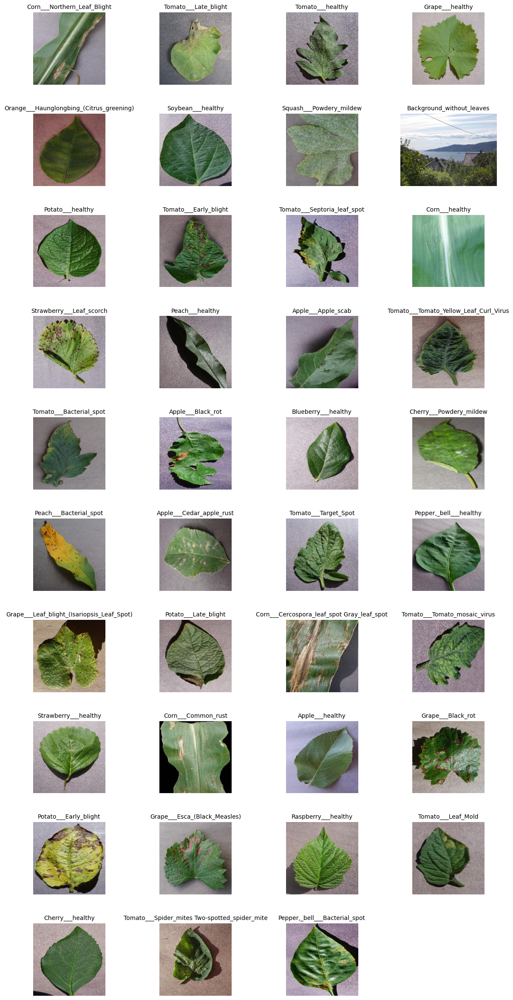

In [9]:
# Create a grid of subplots with 10 rows and 4 columns and set the figure size
fig, axes = plt.subplots(nrows=10, ncols=4, figsize=(15, 30))  # Grid of 10x4 subplots

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Disable all axes initially to handle cases where fewer images are displayed
for idx in range(len(axes)):
    axes[idx].axis('off')  # Turn off the axis for clean display

# Loop through the first 39 diseases and display one random image for each
for classID, className in enumerate(classLabels[:39]):  # Limit to 39 images
    # List all image files in the current className category folder
    img_files = os.listdir(f"{DATASET_FOLDER}/{className}")
    
    # Select a random image file from the category
    img_path = random.choice(img_files)
    
    # Open the selected image using PIL
    img = PIL.Image.open(f"{DATASET_FOLDER}/{className}/{img_path}")
    
    # Convert the image to a NumPy array for compatibility with matplotlib
    img = np.array(img)
    
    # Display the image in the corresponding subplot
    axes[classID].imshow(img, aspect=1)
    
    # Set the title of the subplot to the className
    axes[classID].set_title(className, fontsize=10)

# Adjust spacing between subplots for better readability
plt.subplots_adjust(hspace=0.4, wspace=0.1)

# Display the entire figure with the grid of images
plt.show()

# Train Test Validation split <a id="2"></a>

## Prepare Dataset from folder <a id="2.1"></a>

In [10]:
# Load the dataset from the directory and split it into training and validation datasets
train_dataset, temp_dataset = tf.keras.utils.image_dataset_from_directory(
    directory=DATASET_FOLDER,       # Path to the dataset directory
    labels='inferred',             # Automatically infer labels from subfolder names
    label_mode='categorical',      # Return labels as one-hot encoded vectors
    color_mode= CHANNEL,              # Load images in RGB color format
    batch_size=BATCH_SIZE,         # Number of images per batch
    image_size=(IMAGE_SIZE, IMAGE_SIZE),  # Resize images to a uniform size
    shuffle=True,                  # Shuffle the dataset for randomness
    seed=100,                      # Set a seed for reproducibility
    validation_split=0.3,          # Reserve 30% of the data for validation
    subset='both',                 # Return both training and validation subsets
    interpolation='bilinear',      # Use bilinear interpolation for resizing images
    crop_to_aspect_ratio=False     # Do not crop images to match the aspect ratio
)

Found 61486 files belonging to 39 classes.
Using 43041 files for training.
Using 18445 files for validation.


### Inferred class names

In [11]:
# Retrieve the class names inferred from the subfolder structure in the dataset
# These represent the different categories of the dataset
train_dataset.class_names

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Background_without_leaves',
 'Blueberry___healthy',
 'Cherry___Powdery_mildew',
 'Cherry___healthy',
 'Corn___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn___Common_rust',
 'Corn___Northern_Leaf_Blight',
 'Corn___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Target_Spot'

### Normalization

In [12]:
# Define a rescaling factor to normalize pixel values to the range [0, 1]
rescale_factor = 1.0 / 255

# Apply the rescaling transformation to the training dataset
# Each image's pixel values are multiplied by the rescale factor, and labels remain unchanged
train_dataset = train_dataset.map(lambda x, y: (rescale_factor * x, y))

# Apply the same rescaling transformation to the temporary (validation) dataset
temp_dataset = temp_dataset.map(lambda x, y: (rescale_factor * x, y))

## Validation <a id="2.2"></a>

In [13]:
# Calculate the size of the validation set as 50% of the temporary dataset
temp_size = int(0.5 * temp_dataset.cardinality().numpy())

# Split the temporary dataset to create a validation dataset
# Take the first 'temp_size' samples for the validation dataset
val_dataset = temp_dataset.take(temp_size)

# Create a test dataset using the remaining samples from the temporary dataset
# Skip the first 'temp_size' samples to form the test dataset
test_dataset = temp_dataset.skip(temp_size)

# Print the number of samples in the test and validation datasets
print("Length of Test set:", test_dataset.cardinality().numpy())
print("Length of Validation set:", val_dataset.cardinality().numpy())

Length of Test set: 73
Length of Validation set: 72


In [14]:
del temp_dataset

# Model Building <a id="3"></a>

## Load InceptionV3 Backbone <a id="3.1"></a>

In [15]:
# Load the InceptionV3 model architecture without the top (classification) layer
inception_model = tf.keras.applications.inception_v3.InceptionV3(
    include_top=False,        # Exclude the top fully connected layers (for custom training)
    weights='imagenet',             # Do not load pre-trained weights (train from scratch)
    input_tensor=None,        # Use default input tensor configuration
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),  # Set input shape to match the dataset (e.g., 3 channels for RGB)
    pooling='max'             # Apply global max pooling to the output of the convolutional base
)

# Set all layers of the InceptionV3 model to be trainable
# This allows the entire network to learn during training
for layer in inception_model.layers:
    layer.trainable = True

87910968/87910968 [==============================] - 0s 0us/step


## Head augmentation <a id="3.2"></a>

In [16]:
# Define the model using the Sequential API
model = Sequential([
    inception_model,  # The pre-trained InceptionV3 model (without top layers)
    BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),  # Batch normalization layer to stabilize learning
    Dense(128, activation='relu'),  # Fully connected dense layer with ReLU activation
    Dropout(rate=0.45, seed=123),  # Dropout layer to prevent overfitting
    Dense(39, activation='softmax')  # Output layer with softmax activation for multi-class classification
])

In [17]:
model.save('model_architecture.keras')

In [18]:
model.get_config()

{'name': 'sequential',
 'layers': [{'module': 'keras.layers',
   'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 256, 256, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'inception_v3_input'},
   'registered_name': None},
  {'module': 'keras.src.engine.functional',
   'class_name': 'Functional',
   'config': {'name': 'inception_v3',
    'trainable': True,
    'layers': [{'module': 'keras.layers',
      'class_name': 'InputLayer',
      'config': {'batch_input_shape': (None, 256, 256, 3),
       'dtype': 'float32',
       'sparse': False,
       'ragged': False,
       'name': 'input_1'},
      'registered_name': None,
      'name': 'input_1',
      'inbound_nodes': []},
     {'module': 'keras.layers',
      'class_name': 'Conv2D',
      'config': {'name': 'conv2d',
       'trainable': True,
       'dtype': 'float32',
       'filters': 32,
       'kernel_size': (3, 3),
       'strides': (2, 2),
       'padding': 'valid',
       'd

## Compile the model <a id="3.3"></a>

In [19]:
model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

## Model summary <a id="3.3"></a>

In [20]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 batch_normalization_94 (Ba  (None, 2048)              8192      
 tchNormalization)                                               
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 39)                5031      
                                                                 
Total params: 22078279 (84.22 MB)
Trainable params: 22039751 (84.07 MB)
Non-trainable params: 38528 (150.50 KB)
__________

## Define Callbacks <a id="3.4"></a>

In [21]:
# Define a list of callbacks to monitor and improve training
callbacks = [
    EarlyStopping(min_delta=1e-5, patience=5),  # Stop training early if the improvement is below min_delta for 'patience' epochs
    ModelCheckpoint(filepath="best_model_{epoch:02d}_acc{accuracy:.2f}_val_acc{val_accuracy:.2f}.h5",  # Save the best model
                    save_freq="epoch",           # Save at the end of each epoch
                    save_best_only=True)         # Only save the best model (based on validation accuracy)
]

# Training <a id="4"></a>

In [22]:
# Train the model using the training dataset and validate on the validation dataset
history = model.fit(
    train_dataset,          # Training dataset
    validation_data=val_dataset,  # Validation dataset for monitoring performance
    epochs=EPOCHS,           # Number of epochs to train
    initial_epoch=0,         # Start training from the specified initial epoch (0 if from scratch)
    batch_size=BATCH_SIZE,   # Number of samples per batch
    callbacks=callbacks      # Callbacks to monitor and save the best model and handle early stopping
)

Epoch 1/10
337/337 [==============================] - ETA: 0s - loss: 0.3834 - accuracy: 0.8976

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


337/337 [==============================] - 272s 686ms/step - loss: 0.3834 - accuracy: 0.8976 - val_loss: 0.1024 - val_accuracy: 0.9710
Epoch 2/10
337/337 [==============================] - 222s 657ms/step - loss: 0.0619 - accuracy: 0.9826 - val_loss: 0.1191 - val_accuracy: 0.9729
Epoch 3/10
337/337 [==============================] - 222s 659ms/step - loss: 0.0447 - accuracy: 0.9879 - val_loss: 0.0740 - val_accuracy: 0.9797
Epoch 4/10
337/337 [==============================] - 222s 656ms/step - loss: 0.0381 - accuracy: 0.9901 - val_loss: 0.0974 - val_accuracy: 0.9757
Epoch 5/10
337/337 [==============================] - 222s 656ms/step - loss: 0.0333 - accuracy: 0.9912 - val_loss: 0.1290 - val_accuracy: 0.9705
Epoch 6/10
337/337 [==============================] - 222s 656ms/step - loss: 0.0342 - accuracy: 0.9911 - val_loss: 0.1608 - val_accuracy: 0.9641
Epoch 7/10
337/337 [==============================] - 223s 659ms/step - loss: 0.0286 - accuracy: 0.9925 - val_loss: 0.0592 - val_accura

# Model Evaluation <a id="5"></a>

In [23]:
model.evaluate(test_dataset)

73/73 [==============================] - 29s 305ms/step - loss: 0.0440 - accuracy: 0.9891


[0.04399806633591652, 0.9890562295913696]

## Plot epoch vs accuracy <a id="5.1"></a> 

Text(0.5, 1.0, 'Training and Validation Accuracy\nTrain Accuracy: 0.9947\nValidation Accuracy: 0.9882')

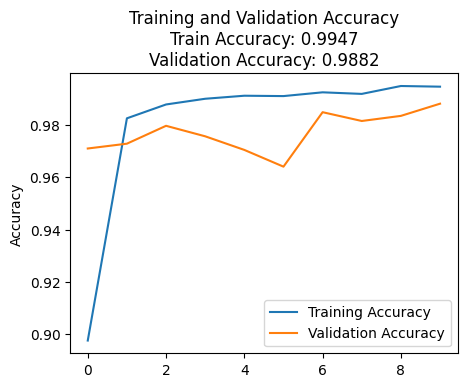

In [24]:
# Store results
acc = history.history['accuracy']       # Training accuracy
val_acc = history.history['val_accuracy']  # Validation accuracy
loss = history.history['loss']           # Training loss
val_loss = history.history['val_loss']   # Validation loss

# Plot accuracy
plt.figure(figsize=(5, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')  # Plot training accuracy
plt.plot(val_acc, label='Validation Accuracy')  # Plot validation accuracy
plt.legend(loc='lower right')  # Add legend
plt.ylabel('Accuracy')  # Y-axis label
plt.title(f'Training and Validation Accuracy\nTrain Accuracy: {acc[-1]:.4f}\nValidation Accuracy: {val_acc[-1]:.4f}')  # Title with final accuracy values

# Save model <a id="6"></a>

In [25]:
with open('latest_model_incept.pkl','wb') as f:
    pickle.dump(model,f)

In [26]:
with open('latest_model_weights.pkl','wb') as f:
    pickle.dump(model.weights,f)

In [27]:
with open('latest_model_get_weights.pkl','wb') as f:
    pickle.dump(model.get_weights,f)

In [28]:
model.save('keras_savedmodel.keras')